In [30]:
import glob
import os
import pickle
import time

from concurrent import futures
from PIL import Image
import numpy as np
from functools import partial

from skimage import io, color
from skimage.feature import hog
from skimage.transform import resize, rescale
from sklearn.externals import joblib
from sklearn.pipeline import make_pipeline
from sklearn import svm

import warnings
warnings.filterwarnings("ignore")

SAMPLE_SIZE = (128, 64)
RATIO = 2

def draw_rect(geo, ax, color='r'):
    x = geo[0]
    y = geo[1]
    w = geo[2]
    h = geo[3]
    ax.add_patch(plt.Rectangle((x, y), w, h, edgecolor=color,
                               alpha=0.3, lw=2, facecolor='none'))
    
def load_label(i):
    with open('projetpers/label.txt') as f:
        lines = f.readlines()
    line = lines[i].split(' ')
    x = int(line[1])
    y = int(line[2])
    w = int(line[3])
    h = int(line[4])
    return x, y, w, h


def build_model():
    svc = svm.SVC(class_weight='balanced', kernel='linear', C=0.01)
    model = make_pipeline(svc)
    return model


def save_model(model):
    joblib.dump(model, 'model.pkl')


def load_model():
    model = joblib.load('model.pkl')
    return model


def partial_resize(img, geos):
    x, y, w, h = geos
    img = resize(img[y:y+h, x:x+w], SAMPLE_SIZE)
    img = get_features(img)
    return img


def sliding_window(img, slide_ratio, scale_step=0.8):
    """
    return all the windows and their geometries in a image
    :param img: the image to be processed
    :param scale_step: scale up the window by 1/scale_step each epoch
    :return: window geometry (x, y, W, H) and window itself
    """
    H, W = SAMPLE_SIZE
    scale = 1.0
    while img.shape[0]>=H and img.shape[1]>=W:
        ystep = max(int((img.shape[0]-H)*slide_ratio), 1)
        xstep = max(int((img.shape[1]-W)*slide_ratio), 1)
        for y in range(0, img.shape[0]-H, ystep):
            for x in range(0, img.shape[1]-W, xstep):
                window = img[y:y+H, x:x+W]
                yield (int(x/scale), int(y/scale), int(W/scale), int(H/scale)), window
        img = rescale(img, scale_step, mode='constant')
        scale *= scale_step


def inter_area_ratio(target_info, window_info):
    """
    determine the overlap_ratio between target and arbitrary window
    :param target_info: the window which contains pedestrian
    :param window_info: arbitrary window
    :param overlap_ratio: close if no less than overlap_ratio
    :return: Boolean
    """
    x0, y0, w0, h0 = target_info
    x, y, w, h = window_info
    if x+w > x0 and x < x0+w0 and y+h > y0 and y < y0+h0:
        if w * h > 1.5 * w0 * h0:
            # if window is significantly bigger
            inter_area_ratio_ = 0
        else:
            inter_area_ratio_ = (min(x+w, x0+w0) - max(x, x0)) * \
                                (min(y+h, y0+h0) - max(y, y0)) / (w*h)
    else:
        inter_area_ratio_ = 0
    return inter_area_ratio_


def get_target_window_border(i, img):
    x, y, w, h = load_label(i)
    max_height, max_width, _ = img.shape

    # center of window
    x_c = int(x + w/2)
    y_c = int(y + h/2)

    if h / w > RATIO:
        w = int(h / RATIO)
    else:
        h = int(RATIO * w)

    # left up corner
    x1 = max(int(x_c - w / 2), 0)
    y1 = max(int(y_c - h / 2), 0)

    # right down corner
    x2 = min(int(x_c + w / 2), max_width)
    y2 = min(int(y_c + h / 2), max_height)

    return x1, y1, x2-x1, y2-y1

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline

def non_maximum_suppression(geos:np.array, ds, threshold):
    final_geos = []
    while True:
        try:
            max_d_geo = geos[np.argmax(ds)]
        except ValueError:
            break
        max_d_geo = list(max_d_geo)
        print(max_d_geo)
        if max_d_geo in final_geos:
            break
        final_geos.append(max_d_geo)
        IoUs = np.array([IoU(max_d_geo, geo) for geo in geos])
        geos = geos[IoUs < threshold]
        ds = ds[IoUs < threshold]
    return final_geos


def IoU(geo1, geo2):
    x1, y1, w1, h1 = geo1
    x2, y2, w2, h2 = geo2
    x_intersection = min(x1+w1, x2+w2) - max(x1, x2)
    y_intersection = min(y1+h1, y2+h2) - max(y1, y2)
    if x_intersection>0 and y_intersection>0:
        intersection = x_intersection * y_intersection
    else:
        intersection = 0
    if intersection / (w2 * h2) > 0.9:
        return 1
    union = w1*h1 + w2*h2 - intersection
    return intersection / union


def get_prediction_windows(img, model):
    #geos_raw, patches_raw are lists
    geos_raw, patches_raw = zip(*sliding_window(img, slide_ratio=0.2))

#     with futures.ProcessPoolExecutor() as executor:
#         results = executor.map(get_features, patches_raw)
    results = map(get_features, patches_raw)
    patches = list(results) # list of np.arrays
    # pick out geos of imgs whose prediction == 1
    prediction = model.predict(patches)
    geos = np.array(geos_raw)[prediction == 1]
    ys = model.decision_function(patches)[prediction == 1]
    w_norm = np.linalg.norm(model.named_steps.svc.coef_)
    ds = ys/w_norm

    with open('geos_ds.txt', 'wb') as f:
        pickle.dump((geos, ds), f)

    interception = ds.shape[0]//3
    geos = geos[np.argsort(ds)[-2*interception:-interception]]
    ds = ds[np.argsort(ds)[-2*interception:-interception]]

    return geos, ds


def test_with_image(img, model):
    geos, ds = get_prediction_windows(img, model)
    print(geos)

    final_geos = non_maximum_suppression(geos, ds, 0.2)

    fig, ax = plt.subplots()
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    for geo in geos:
       draw_rect(geo, ax, color='green')
    
    for geo in final_geos:
       draw_rect(geo, ax, color='red')

    plt.show()


# LOAD DATA

In [14]:
train_image_list = []
for filename in sorted(glob.glob(os.path.join('projetpers/train', '*.jpg'))):
    im = io.imread(filename)
    train_image_list.append(im)

train_positive_image_list = []
train_negative_image_list = []

In [19]:
for i, image in enumerate(train_image_list):
    x, y, w, h = get_target_window_border(i, image)
    cropped_image = image[y:y+h, x:x+w, :]
    resized_image = resize(cropped_image, SAMPLE_SIZE)
    flipped_image = np.fliplr(resized_image)

    train_positive_image_list.append(resized_image)
    train_positive_image_list.append(flipped_image)

In [22]:
def generate_neg_images(i, img, overlap_ratio=0.4):
    """
    Given an image, return all negative windows.
    Method: calc the overlap area of window to target pedestrian area,
    if less than 0.7, then it's negative window.
    :param i: image index
    :return: all negative windows
    """
    train_neg_img = []
    window_infos = []
    target_info = get_target_window_border(i, img)

    for window_info, window in sliding_window(img, slide_ratio=0.2):
        if inter_area_ratio(target_info, window_info) < overlap_ratio:
            train_neg_img.append(window)
            window_infos.append(window_info)
    return train_neg_img, window_infos

In [25]:
for i, image in enumerate(train_image_list):
    negative_image_list, negative_image_geos = generate_neg_images(i, image)
    train_negative_image_list.extend(negative_image_list)

In [26]:
len(train_negative_image_list)

38282

In [31]:
X_train_raw = train_positive_image_list + train_negative_image_list

In [38]:
def get_features(img):
    return hog(img, orientations=9, pixels_per_cell=(6,6),
               cells_per_block=(3,3), block_norm='L2-Hys', transform_sqrt=True)

# with futures.ProcessPoolExecutor() as executor:
#     results = executor.map(get_features, X_train_raw)
X_pos = list(map(get_features, train_positive_image_list))
X_neg = list(map(get_features, train_negative_image_list))

In [41]:
# take 1/3 negative samples
n_neg = int(len(X_neg)/3)
import random
random.shuffle(X_neg)
X_train = X_pos + X_neg[:n_neg]
mining_samples = X_neg[n_neg:]

In [42]:
y_positive = [1] * len(train_positive_image_list)
y_negative = [0] * len(train_negative_image_list)
y_train = y_positive + y_negative[:n_neg]

In [44]:
X_train = np.array(X_train)
y_train = np.array(y_train)
X_train.shape

(13560, 12312)

# TRAIN

In [49]:
svc = svm.SVC(class_weight='balanced', kernel='linear', C=0.01)
m = make_pipeline(svc)
m.fit(X_train, y_train)
joblib.dump(m, 'model.pkl')

['model.pkl']

In [50]:
y_pred = m.predict(X_train)
import sklearn.metrics as metrics
print(metrics.confusion_matrix(y_train, y_pred))
print(metrics.classification_report(y_train, y_pred))

[[12703    57]
 [    0   800]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12760
           1       0.93      1.00      0.97       800

   micro avg       1.00      1.00      1.00     13560
   macro avg       0.97      1.00      0.98     13560
weighted avg       1.00      1.00      1.00     13560



# TEST

[]


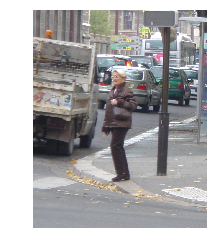

[[207 225 195 390]
 [  0 320  80 160]
 [131 107 381 762]
 [262 178 381 762]
 [262 143 381 762]
 [262 107 381 762]]
[262, 107, 381, 762]
[0, 320, 80, 160]
[207, 225, 195, 390]


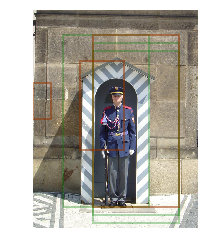

[]


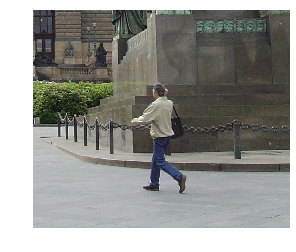

[]


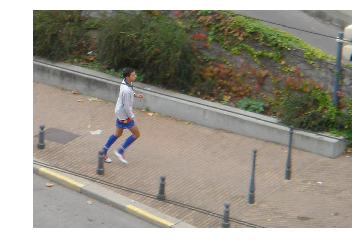

[]


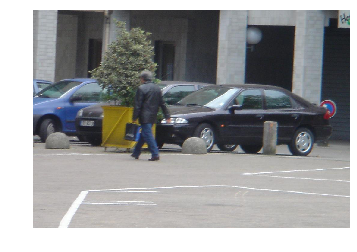

[]


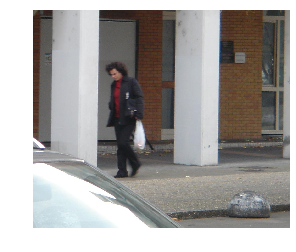

[]


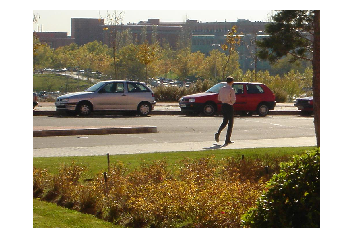

[]


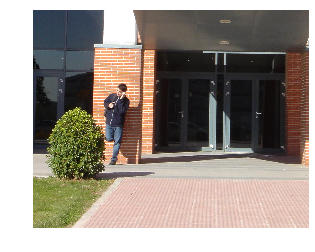

[]


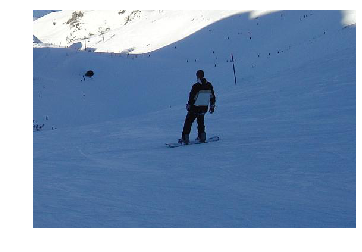

[[  0   0 244 488]
 [  0  30 244 488]
 [ 30  22 244 488]
 [ 15  22 244 488]
 [  0   7 244 488]
 [ 45  38 244 488]
 [ 54  54 195 390]
 [ 30  38 244 488]]
[30, 38, 244, 488]


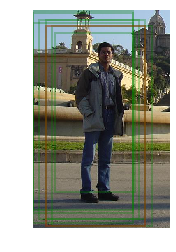

[[114  19 305 610]
 [152  57 305 610]
 [114  38 305 610]
 [114  57 305 610]]
[114, 57, 305, 610]


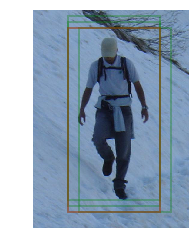

[]


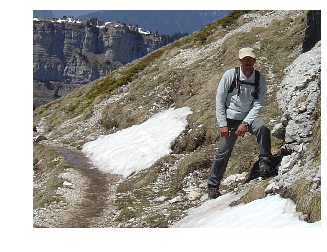

[]


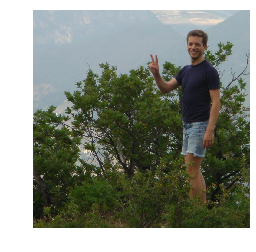

[[424 241 156 312]]
[424, 241, 156, 312]


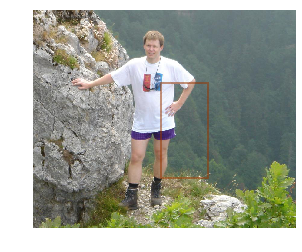

[[129 137 244 488]]
[129, 137, 244, 488]


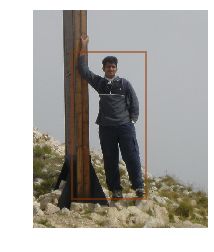

[[218   0  99 199]
 [ 88 128 195 390]]
[88, 128, 195, 390]
[218, 0, 99, 199]


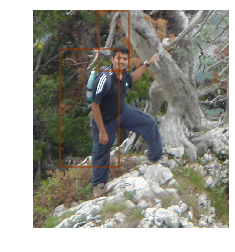

[[322 241 156 312]]
[322, 241, 156, 312]


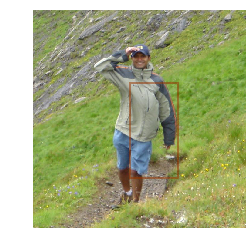

[[598 122 195 390]
 [514  57 305 610]]
[514, 57, 305, 610]


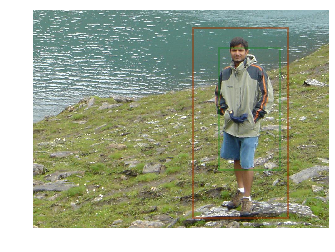

[[476  57 305 610]]
[476, 57, 305, 610]


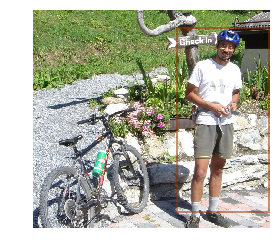

[[282 137 244 488]
 [305 103 195 390]]
[305, 103, 195, 390]


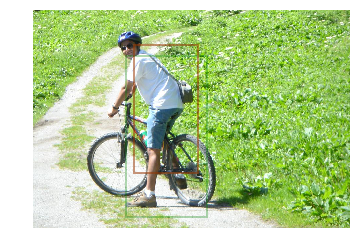

[[282  26 244 488]]
[282, 26, 244, 488]


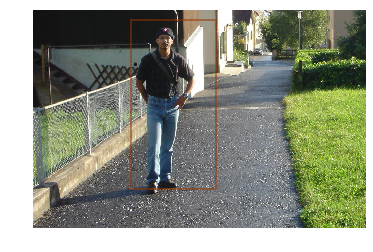

[[146   0 195 390]
 [123  76 305 610]]
[123, 76, 305, 610]


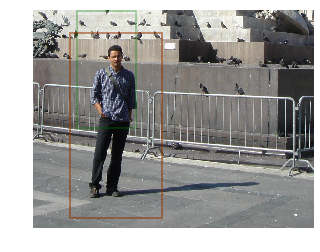

[[126 190 156 312]
 [299   0  99 199]]
[299, 0, 99, 199]
[126, 190, 156, 312]


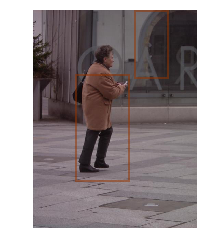

[[137 122 244 488]]
[137, 122, 244, 488]


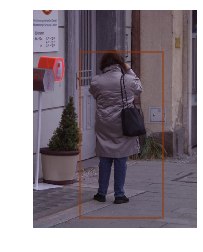

[[190 190 156 312]]
[190, 190, 156, 312]


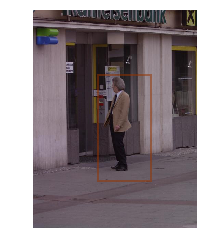

[]


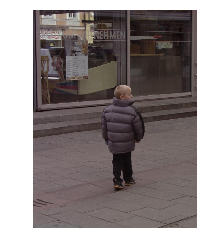

[]


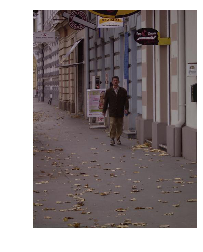

[[100  14 305 610]
 [100   4 305 610]
 [100   9 305 610]]
[100, 9, 305, 610]


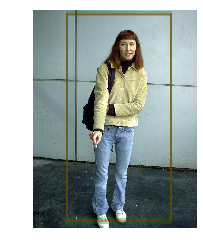

[[137  91 244 488]
 [  0 317 156 312]]
[0, 317, 156, 312]
[137, 91, 244, 488]


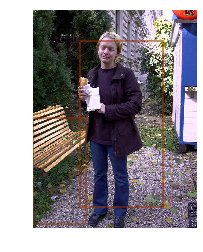

[[  0  19 305 610]
 [ 33  23 305 610]
 [ 54 146 195 390]]
[54, 146, 195, 390]


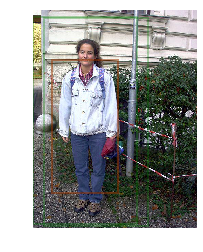

[[ 45 122 244 488]
 [ 33  14 305 610]
 [ 91  91 244 488]]
[91, 91, 244, 488]


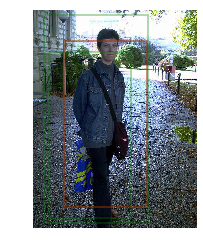

[[ 91  91 244 488]
 [ 66  14 305 610]
 [ 66  19 305 610]
 [100   0 305 610]
 [100   4 305 610]
 [ 66  23 305 610]]
[66, 23, 305, 610]


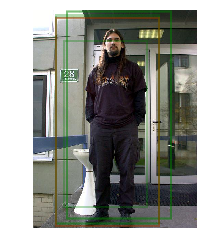

[]


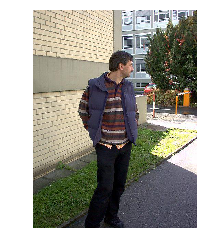

[[ 33  14 305 610]
 [ 33   9 305 610]
 [ 33  19 305 610]
 [ 66   9 305 610]
 [ 91  91 244 488]]
[91, 91, 244, 488]


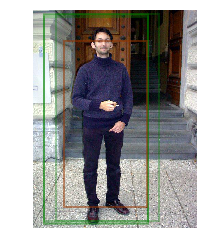

[[137  61 244 488]
 [183  61 244 488]]
[183, 61, 244, 488]


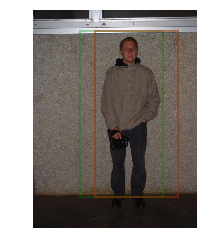

[]


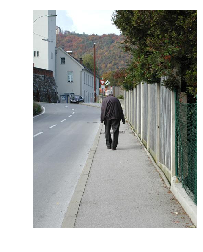

[[126   0 156 312]
 [137  61 244 488]
 [  0   0  80 160]
 [137   0 244 488]]
[137, 0, 244, 488]
[0, 0, 80, 160]


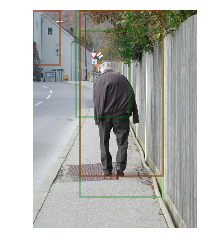

[]


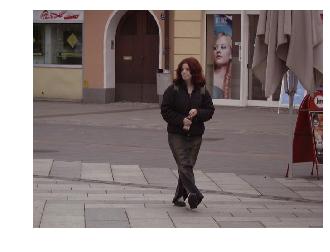

[]


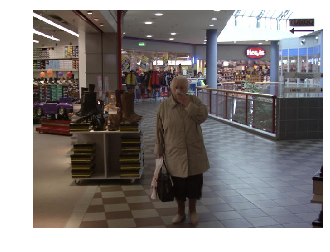

[[304 179 124 249]
 [107 218  99 199]]
[107, 218, 99, 199]
[304, 179, 124, 249]


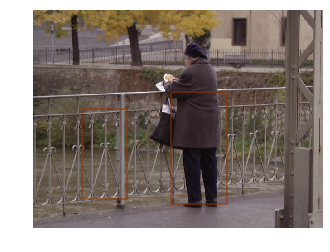

[[285 126 156 312]
 [  0  63  80 160]]
[0, 63, 80, 160]
[285, 126, 156, 312]


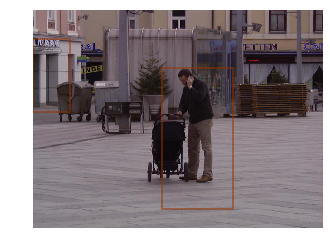

[[304 179 124 249]]
[304, 179, 124, 249]


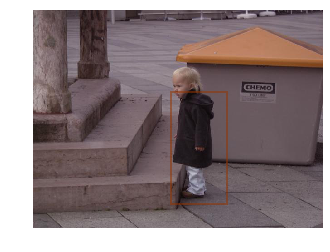

[]


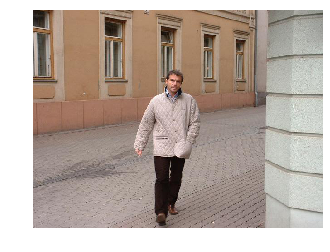

[]


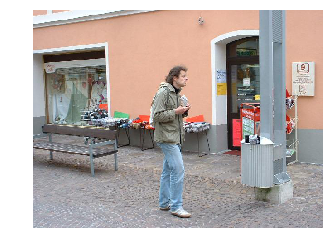

[]


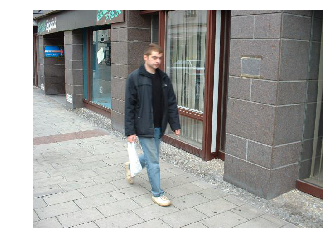

[]


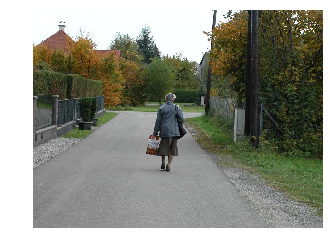

[[  0  18 195 390]]
[0, 18, 195, 390]


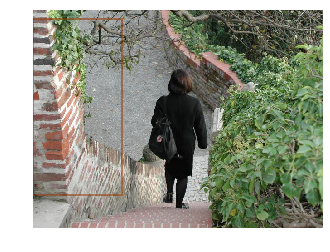

[[224 174  99 199]]
[224, 174, 99, 199]


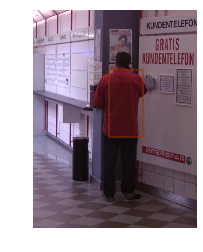

[[299  87  99 199]]
[299, 87, 99, 199]


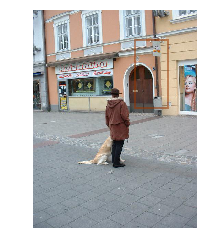

[]


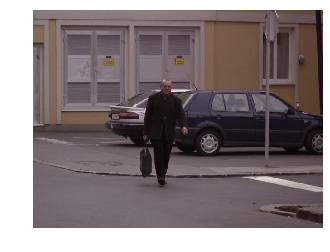

[[100   4 305 610]
 [ 66   4 305 610]
 [164 146 195 390]
 [ 66   9 305 610]
 [137  91 244 488]
 [ 66  14 305 610]
 [100   9 305 610]]
[100, 9, 305, 610]


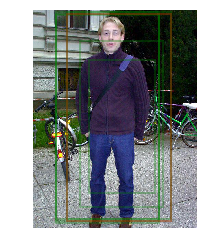

[[265  18 195 390]
 [285 126 156 312]
 [265  54 195 390]]
[265, 54, 195, 390]


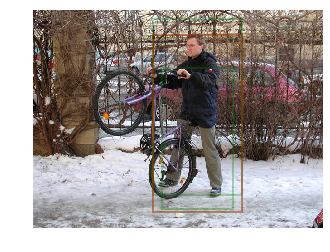

[[285  63 156 312]
 [285  31 156 312]]
[285, 31, 156, 312]


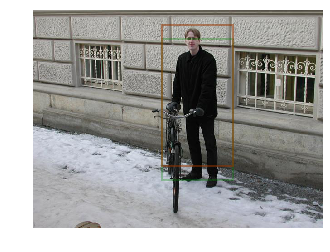

[[345 280  64 128]]
[345, 280, 64, 128]


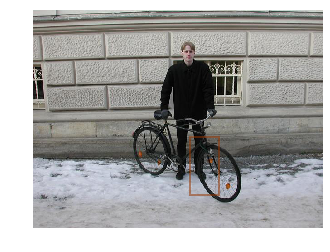

[[190  63 156 312]
 [177  73 195 390]]
[177, 73, 195, 390]


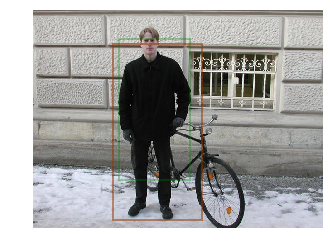

[[  0   0  64 128]]
[0, 0, 64, 128]


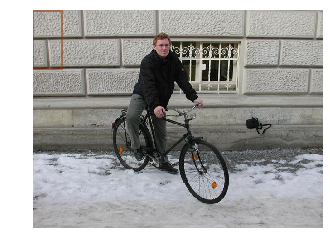

[]


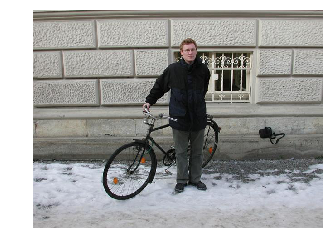

[[177  18 195 390]
 [323 218  99 199]
 [177  54 195 390]]
[177, 54, 195, 390]
[323, 218, 99, 199]


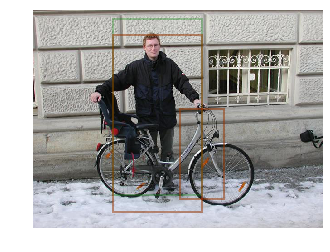

[[265  18 195 390]
 [222 191  80 160]]
[222, 191, 80, 160]
[265, 18, 195, 390]


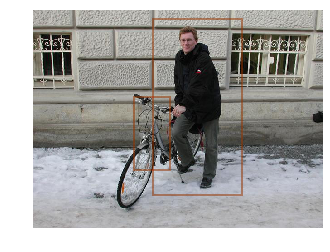

[[230 280  64 128]
 [285  31 156 312]]
[285, 31, 156, 312]
[230, 280, 64, 128]


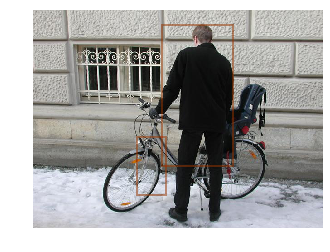

[[285  63 156 312]]
[285, 63, 156, 312]


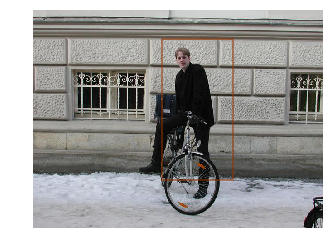

[[333 318  80 160]]
[333, 318, 80, 160]


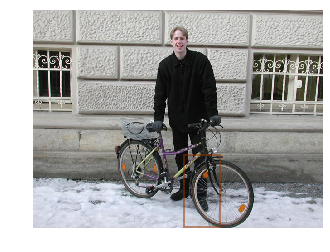

[[333   0  80 160]]
[333, 0, 80, 160]


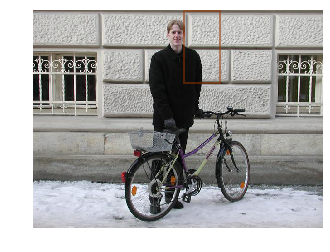

[[431   0  99 199]
 [177  73 195 390]]
[177, 73, 195, 390]
[431, 0, 99, 199]


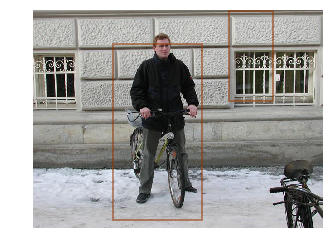

[[203  89 124 249]
 [177  54 195 390]
 [215 109  99 199]]
[215, 109, 99, 199]


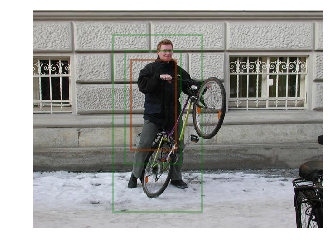

[[265  18 195 390]]
[265, 18, 195, 390]


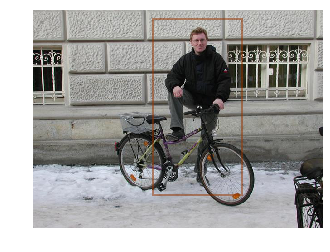

[]


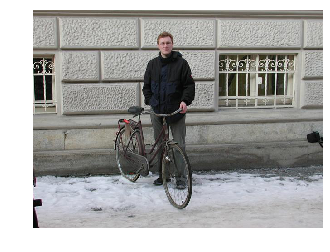

[]


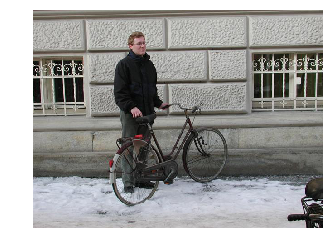

[]


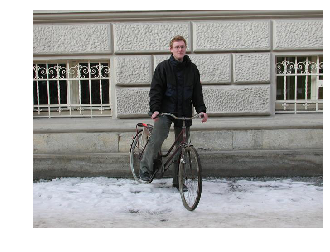

[[215   0  99 199]]
[215, 0, 99, 199]


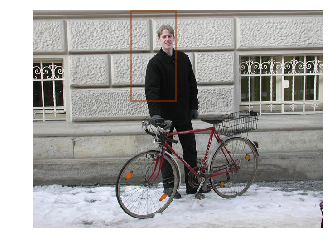

[[285  63 156 312]]
[285, 63, 156, 312]


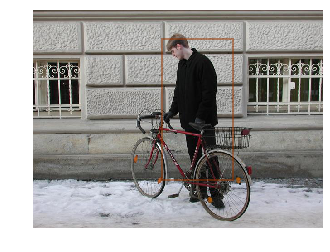

[]


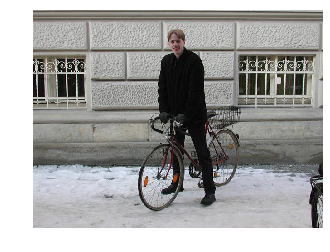

[[215 109  99 199]
 [203  44 124 249]
 [265  54 195 390]]
[265, 54, 195, 390]
[203, 44, 124, 249]


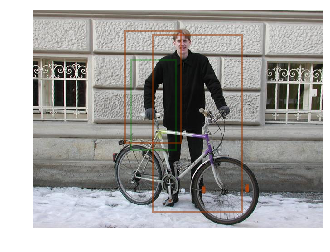

[[177  36 195 390]]
[177, 36, 195, 390]


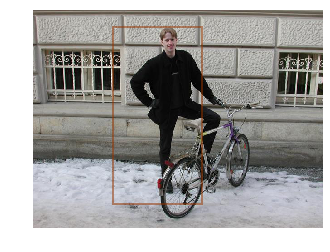

[[177   0 195 390]
 [177  18 195 390]]
[177, 18, 195, 390]


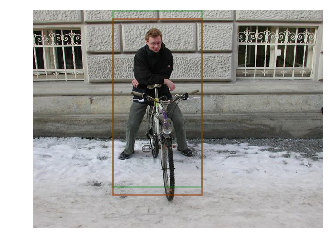

[[177  36 195 390]]
[177, 36, 195, 390]


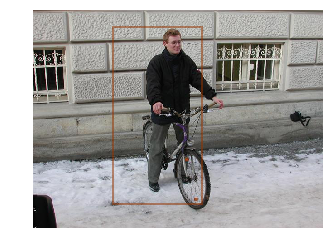

[[539   0  99 199]]
[539, 0, 99, 199]


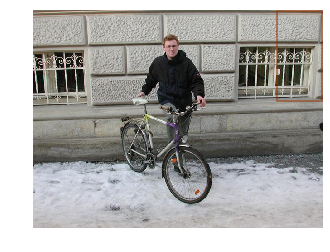

[[265  54 195 390]]
[265, 54, 195, 390]


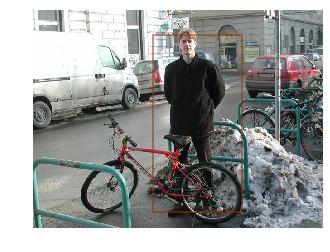

[[445 255  80 160]]
[445, 255, 80, 160]


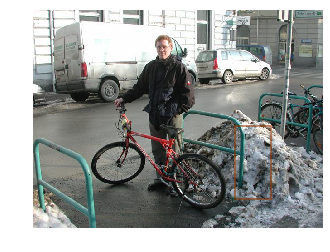

[]


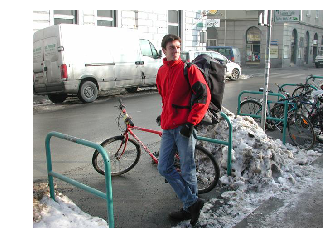

[[354  36 195 390]]
[354, 36, 195, 390]


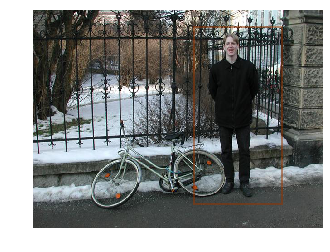

[[507   0 124 249]
 [101   0 124 249]]
[101, 0, 124, 249]
[507, 0, 124, 249]


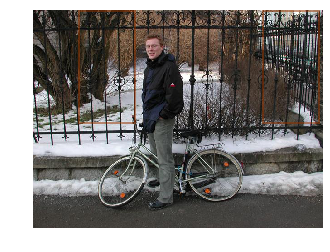

[]


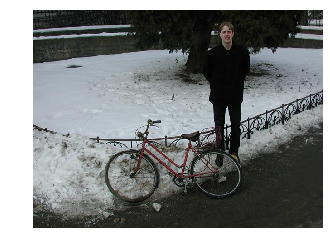

[[265  73 195 390]
 [111 318  80 160]
 [215  54  99 199]]
[215, 54, 99, 199]
[111, 318, 80, 160]
[265, 73, 195, 390]


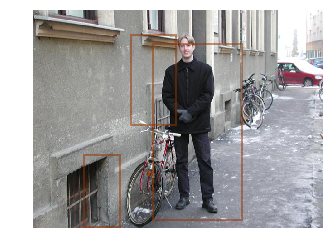

[[354  36 195 390]]
[354, 36, 195, 390]


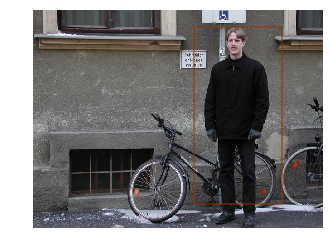

[[265  54 195 390]]
[265, 54, 195, 390]


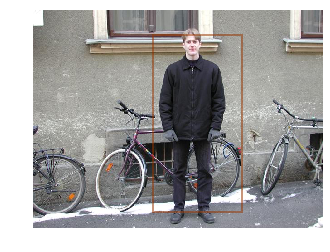

[[265  18 195 390]
 [265  73 195 390]]
[265, 73, 195, 390]


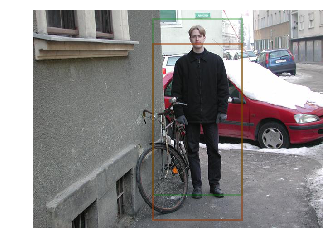

[[215  54  99 199]]
[215, 54, 99, 199]


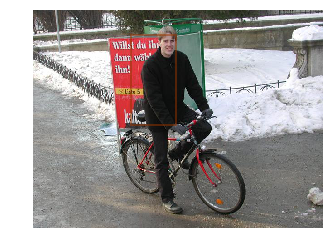

[[333 318  80 160]]
[333, 318, 80, 160]


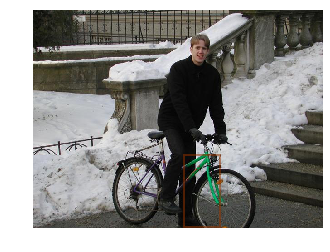

[[265  54 195 390]]
[265, 54, 195, 390]


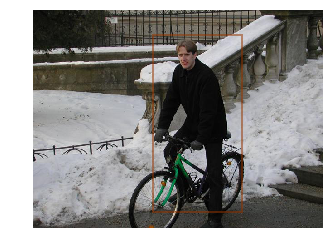

[[265  54 195 390]]
[265, 54, 195, 390]


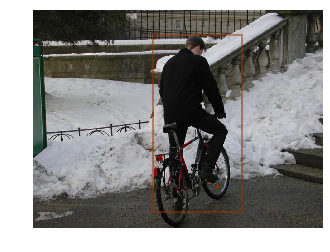

[[285  31 156 312]
 [304 179 124 249]]
[304, 179, 124, 249]


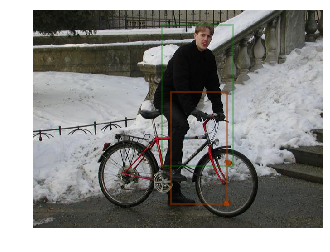

[[406  44 124 249]]
[406, 44, 124, 249]


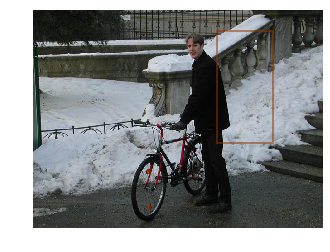

[[177   0 195 390]
 [190  63 156 312]
 [  0 210  64 128]]
[0, 210, 64, 128]
[190, 63, 156, 312]


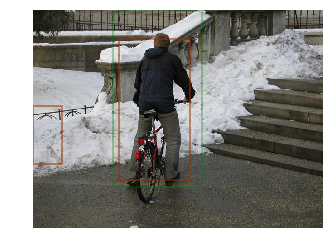

[[101  89 124 249]
 [ 88  36 195 390]]
[88, 36, 195, 390]


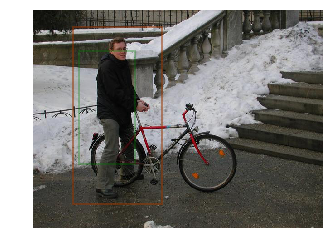

[]


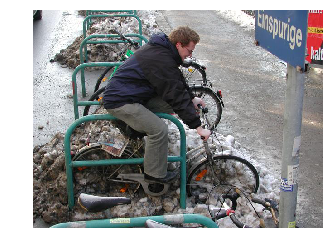

[]


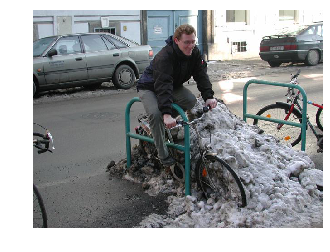

[[230 210  64 128]]
[230, 210, 64, 128]


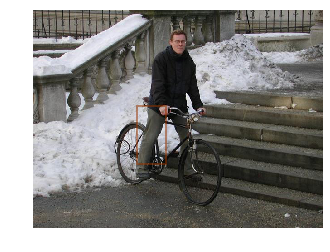

[[345 280  64 128]]
[345, 280, 64, 128]


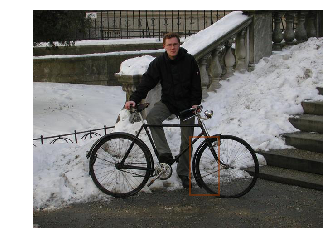

[]


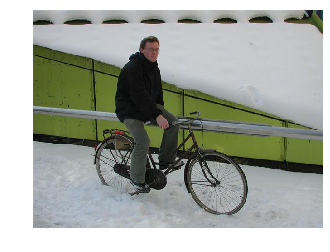

In [51]:
# m = load_model()
test_file_names = sorted(glob.glob('projetpers/test/*.jpg'))
for i in range(100):
    img=io.imread(test_file_names[i])
    test_with_image(img, m)

# HARDMINE

In [55]:
mining_samples_pred = m.predict(mining_samples)

In [63]:
hard_exp = np.array(mining_samples)[mining_samples_pred==1]

In [64]:
len(hard_exp)

174

In [68]:
X_train_m = np.concatenate((X_train, hard_exp))
y_train_m = np.concatenate((y_train, [0]*len(hard_exp)))

In [69]:
len(y_train_m)

13734

In [62]:
mining_samples_pred==1

array([False, False, False, ..., False, False, False])

In [70]:
svc = svm.SVC(class_weight='balanced', kernel='linear', C=0.01)
m_m = make_pipeline(svc)
m_m.fit(X_train_m, y_train_m)
joblib.dump(m_m, 'model_mine.pkl')

['model_mine.pkl']

In [ ]:
y_pred = m_m.predict(X_train)
import sklearn.metrics as metrics
print(metrics.confusion_matrix(y_train, y_pred))
print(metrics.classification_report(y_train, y_pred))

# TEST

In [ ]:
# m = load_model()
test_file_names = sorted(glob.glob('projetpers/test/*.jpg'))
for i in range(30):
    img=io.imread(test_file_names[i])
    test_with_image(img, m_m)